# Modal decomposition of partially coherent vortex beams

In this notebook, we study a modal decomposition scheme for partially coherent vortex beams.  First, we load the necessary functions

In [1]:
include("ModalPhase.jl")
include("PartiallyCoherentSimulation.jl")
using Plots
#using Benchmark
gr()

Plots.GRBackend()

The number of threads is

In [6]:
Threads.nthreads()

4

Now, we will compute the phase element to perform the modal decomposition

In [63]:
N=1
Ne=1
w=1.3
wv=2.5
c=0.0
TC1=2.
pts=128
@time Ph, Phsum, Phave = PCsimulationPhase(N,Ne,w,wv,c,TC1,pts);
#Phave = pi * Phave/maximum(abs.(Phave))

  0.004105 seconds (65 allocations: 2.257 MiB)


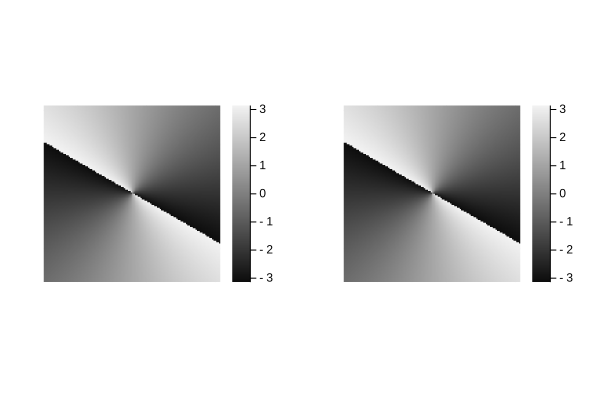

In [64]:
p1=heatmap(Ph', aspect_ratio=1, colorbar=true, color=:grays, axis=:off) # plotlyjs
p2=heatmap(Phave', aspect_ratio=1, colorbar=true, color=:grays, axis=:off) # plotlyjs
plot(p1, p2, layout=(1,2))

We want to perform the modal decomposition for the following PCVB

In [93]:
N=100
Ne=200
w=1.3
wv=2.5
c=0.7
Ttest=-4.5
@time I, XI = PCsimulationSC(N,Ne,w,wv,c,Ttest,pts);
absI=abs.(I)
absXI=abs.(XI)
absIlg1=absI/maximum(absI)
absXIlg1=absXI/maximum(absXI);

 14.043910 seconds (291.94 k allocations: 17.290 GiB, 10.27% gc time)


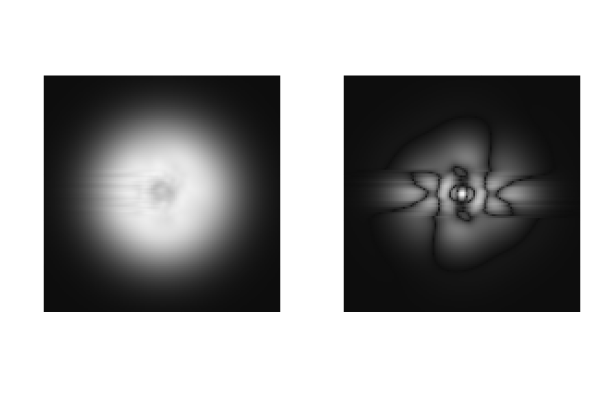

In [94]:
p11=heatmap(sqrt.(absIlg1)', aspect_ratio=1, colorbar=false, color=:grays, axis=:off) # plotlyjs
p22=heatmap(sqrt.(absXIlg1)', aspect_ratio=1, colorbar=false, color=:grays, axis=:off) # plotlyjs
plot(p11, p22, layout=(1,2))

With the calculated phase, we perform a modal decomposition

In [95]:
N=100
Ne=100
#Ttest=-1.
#c=0.7
@time Imd = ModalDecomp(N,Ne,w,wv,c,Ttest,pts,Phave)
Imd = Imd/maximum(Imd);

  7.064833 seconds (154.98 k allocations: 8.658 GiB, 10.29% gc time)


0.21234158991813598


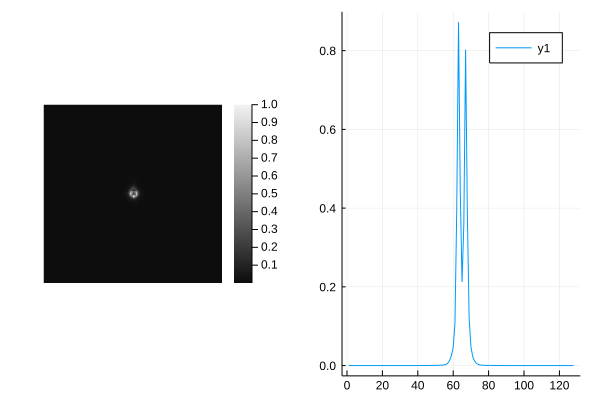

In [96]:
println(Imd[div(end,2)+1,div(end,2)+1])
p3=heatmap(Imd', aspect_ratio=1, colorbar=true, color=:grays, axis=:off) # gr
p4=plot(Imd[:,div(end,2)+1])
plot(p3, p4, layout=(1,2))